# Imports and Setup


In [2]:
!git clone https://github.com/Hari31416/TorchLight
!cp -r ./TorchLight/* ./

Cloning into 'TorchLight'...
remote: Enumerating objects: 233, done.
remote: Counting objects: 100% (233/233), done.
remote: Compressing objects: 100% (154/154), done.
remote: Total 233 (delta 146), reused 163 (delta 76), pack-reused 0 (from 0)
Receiving objects: 100% (233/233), 1.11 MiB | 22.73 MiB/s, done.
Resolving deltas: 100% (146/146), done.


In [48]:
from torchlight.utils import (
    create_simple_logger,
    T,
)
from torchlight import objective as tl_objective
from torchlight.objective import (
    create_objective,
    create_objective_with_multi_hook,
    create_objective_from_function,
)
from torchlight.image import get_image, cppn
from torchlight.optimize import FeatureViz
from torchlight.models import InceptionV1
from torchlight.io import (
    animate_sequence,
    show_images,
)

import torch

import numpy as np

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
logger = create_simple_logger(
    "Feature_Visualization_1", set_level_to_all_loggers=True, level="warning"
)  # sets level of all loggers to warning
model = InceptionV1(pretrained=True, redirected_ReLU=True).eval().to(device)
layer_to_feature_num_map = {
    "conv2d0_pre_relu_conv": 64,
    "conv2d1_pre_relu_conv": 64,
    "conv2d2_pre_relu_conv": 192,
    "mixed3a": 256,
    "mixed3b": 480,
    "mixed4a": 508,
    "mixed4b": 512,
    "mixed4c": 512,
    "mixed4d": 528,
    "mixed4e": 832,
    "mixed5a": 832,
    "mixed5b": 1024,
}


# create thresholds for images
def get_thresholds(last_n=10):
    thresholds = [2**n for n in range(5, last_n)]
    thresholds[0] = 0
    return thresholds


thresholds_low = get_thresholds(10)
thresholds_high = get_thresholds(12)

Downloading: "https://github.com/ProGamerGov/pytorch-old-tensorflow-models/raw/master/inception5h.pth" to /root/.cache/torch/hub/checkpoints/inception5h.pth
100%|██████████| 27.0M/27.0M [00:00<00:00, 260MB/s]


In [49]:
def visualize(
    objective,
    model=model,
    param_f=None,
    thresholds=thresholds_low,
    lr=0.05,
    show_progress=True,
    show_last_image=True,
):
    fv = FeatureViz(model=model, objective=objective, normalize_gradients=False)
    images = fv.visualize(
        param_f,
        show_last_image=show_last_image,
        show_progress=show_progress,
        thresholds=thresholds,
        lr=lr,
    )
    return images


def visualize_from_hook(
    layer_name,
    channel_number=None,
    neuron_number=None,
    loss_function=None,
    extractor_function=None,
    extractor_function_kwargs={},
    model=model,
    param_f=None,
    thresholds=thresholds_low,
    lr=0.05,
    show_progress=True,
    show_last_image=True,
):
    hook = tl_objective.Hook(
        layer_name,
        channel_number,
        neuron_number,
        loss_function,
        extractor_function,
        extractor_function_kwargs,
    )
    obj = tl_objective.Objective(hook, name=layer_name)
    images = visualize(
        obj, model, param_f, thresholds, lr, show_progress, show_last_image
    )
    return images

# Simple Feature Visualization


There are different optimization objectives when it comes to simple feature visualization of an CNN. Let us denote $n$ as the layer number, $x$ and $y$ as spatial direction, $z$ as channel index and $k$ as the class index. Using these notation, some of these objectives are discusses below.


## Visualizing a Single Neuron


We want to optimize what a single neuron learns. In our notation, we try to optimize the activation $\text{layer}_n[x, y,z]$. Some other ways to define similar objective is to optimize a slice along the channel direction at the given neuron position, that is, optimzing $\text{layer}_n[x, y,:]$


  0%|          | 0/513 [00:00<?, ?it/s]


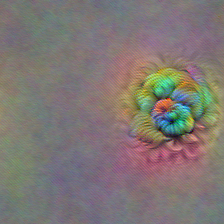

In [6]:
# 100th nueron of 5th channel of mixed4a layer
images = visualize(objective="mixed4a:5:100")

  0%|          | 0/513 [00:00<?, ?it/s]


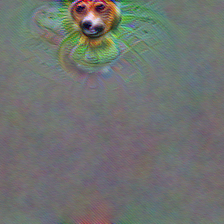

In [7]:
# a slice along channel at 5th neuron for mixed4a
images = visualize_from_hook(layer_name="mixed4a", neuron_number=5)

## Visualize a Channel


Visualizing a channel amounts to optimizing the activation of a whole channel, that is, $\text{layer}_n[:, :,z]$. This is usually the best way to visualize what a network learns.


  0%|          | 0/513 [00:00<?, ?it/s]


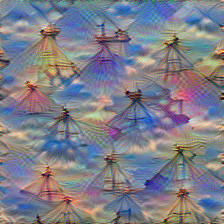

In [50]:
# 492nd channel of mixed4a layer
images = visualize(objective="mixed4a:492")

  0%|          | 0/513 [00:00<?, ?it/s]


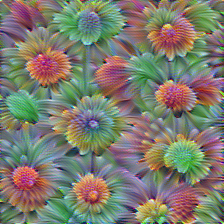

In [51]:
# 16th channel of mixed4b_pool_reduce_pre_relu_conv layer
images = visualize(objective="mixed4b_pool_reduce_pre_relu_conv:16")

## Visualizing a Layer


This involves optimizing for whole layer $\text{layer}_n[:, :,]$. Usually, the square of the whole layer is optimized as taking mean of the layer output on its own may result in not getting the desired output.


  0%|          | 0/513 [00:00<?, ?it/s]


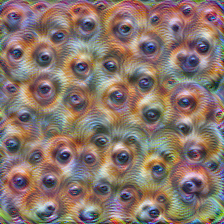

In [52]:
# mixed4a layer taking simple mean
images = visualize(objective="mixed4a")

  0%|          | 0/513 [00:00<?, ?it/s]


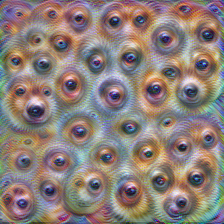

In [53]:
# mixed4a layer taking mean of the square
def extractor_function_for_layer(layer_out: T):

    return -layer_out.pow(2).mean()


images = visualize_from_hook(
    layer_name="mixed4a", extractor_function=extractor_function_for_layer
)

## Visualizing the Output


Another objective is to optimize the model output itself. Generally, the $k$th entry of the output of the model is optimized.


  0%|          | 0/513 [00:00<?, ?it/s]


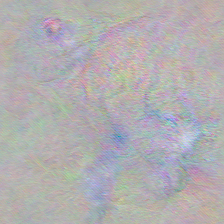

In [54]:
k = 10


def extractor_function_for_output(output: T):
    return -output[:, k]


images = visualize_from_hook(
    layer_name="output", extractor_function=extractor_function_for_output, lr=0.1
)

Of course, vizualize the output itself is not very informative as the activation is mostly _averaged out_.

A better way will be to optimize the pre-softmax class logits. For InceptionV1, we can use the output from `softmax2_pre_activation_matmul` layer. This is not exactly the class logits, but works very well for our case.


  0%|          | 0/513 [00:00<?, ?it/s]


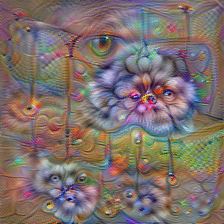

In [55]:
k = 10


def extractor_function_for_output(output: T):
    return -output[:, k]


images = visualize_from_hook(
    layer_name="softmax2_pre_activation_matmul",
    extractor_function=extractor_function_for_output,
    lr=0.1,
)

  0%|          | 0/513 [00:00<?, ?it/s]


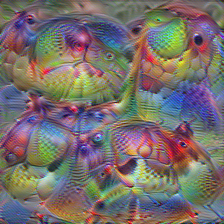

In [56]:
k = 0


def extractor_function_for_output(output: T):
    return -output[:, k]


images = visualize_from_hook(
    layer_name="softmax2_pre_activation_matmul",
    extractor_function=extractor_function_for_output,
    lr=0.1,
)

## Diversity


In most cases, the neuron does not detect only a single feature, as they are usually **polysemantic**. The visualization produced above are not able to capture this since they are able to provide only a part of the picture.

One way to mitigate this is to optimize a bunch of images for the objective and add some extra constraint that penalizes the similarity between the images. This can be attained simply by using adding a extra loss, such as the cosine similarity between the image. The `diversity_loss` method can be used for this.


  0%|          | 0/513 [00:00<?, ?it/s]

0,1,2,3

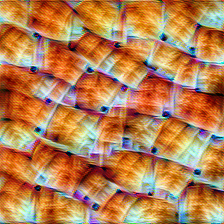
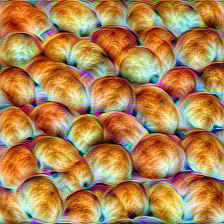
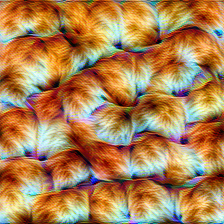
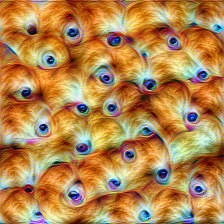

In [11]:
ch = 143


def channel_loss(layer_output):
    channel_out = layer_output[:, ch, ...]
    return -channel_out.mean()


diversity_obj = create_objective_from_function(
    tl_objective.diversity_loss, layer_name="mixed4a"
)
channel_objs = create_objective_from_function(channel_loss, layer_name="mixed4a")
final_obj = channel_objs - 100 * diversity_obj
param_f = lambda: get_image(w=224, batch=4, decorrelate=True)
images = visualize(final_obj, param_f=param_f, thresholds=thresholds_low)

  0%|          | 0/513 [00:00<?, ?it/s]

0,1,2,3

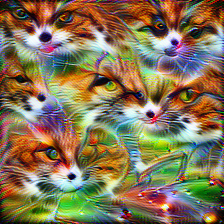
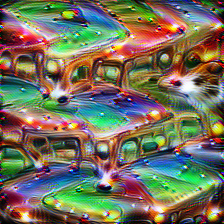
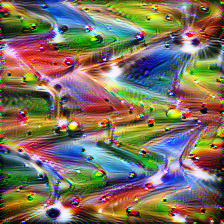
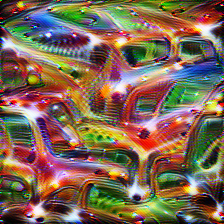

In [12]:
ch = 55


def channel_loss(layer_output):
    channel_out = layer_output[:, ch, ...]
    return -channel_out.mean()


diversity_obj = create_objective_from_function(
    tl_objective.diversity_loss, layer_name="mixed4e"
)
channel_objs = create_objective_from_function(channel_loss, layer_name="mixed4e")
final_obj = channel_objs - 100 * diversity_obj
param_f = lambda: get_image(w=224, batch=4)
images = visualize(final_obj, param_f=param_f, thresholds=thresholds_low)

  0%|          | 0/513 [00:00<?, ?it/s]

0,1,2,3

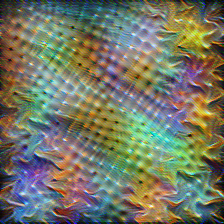
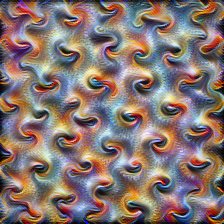
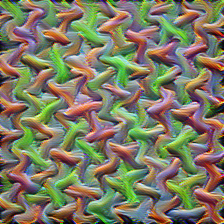
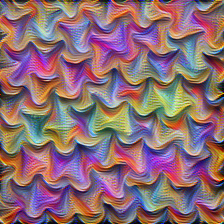

In [13]:
ch = 97


def channel_loss(layer_output):
    channel_out = layer_output[:, ch, ...]
    return -channel_out.mean()


diversity_obj = create_objective_from_function(
    tl_objective.diversity_loss, layer_name="mixed4a"
)
channel_objs = create_objective_from_function(channel_loss, layer_name="mixed4a")
final_obj = channel_objs - 1000 * diversity_obj
param_f = lambda: get_image(w=224, batch=4)
images = visualize(final_obj, param_f=param_f, thresholds=thresholds_low)

  0%|          | 0/513 [00:00<?, ?it/s]

0,1,2,3

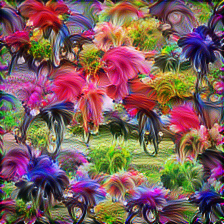
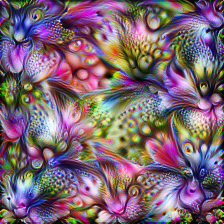
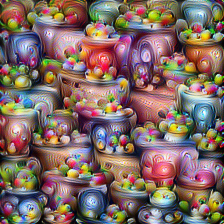
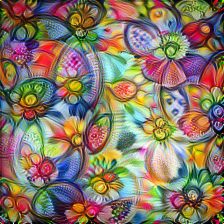

In [14]:
ch = 139


def channel_loss(layer_output):
    channel_out = layer_output[:, ch, ...]
    return -channel_out.mean()


diversity_obj = create_objective_from_function(
    tl_objective.diversity_loss, layer_name="mixed4d_3x3_bottleneck_pre_relu_conv"
)
channel_objs = create_objective_from_function(
    channel_loss, layer_name="mixed4d_3x3_bottleneck_pre_relu_conv"
)
final_obj = channel_objs - 1000 * diversity_obj
param_f = lambda: get_image(w=224, batch=4, decorrelate=False)
images = visualize(final_obj, param_f=param_f, thresholds=thresholds_low)

# More Involved Feature Visualizations


A neural network does not rely on a single neuron (or channel and layer for that case) to make a prediction. Though, visualizing a neuron/channel/layer on its own does has its merit, one must understand how different objectives interact with each other to get a full picture.


## Negative Optimization


To figure out what a neuron has learned, we try to find the image that maximizes the activation of that particular neuron. One can also optimize for an image that minimizes the activation.


  0%|          | 0/513 [00:00<?, ?it/s]

mixed4b:111,-mixed4b:111

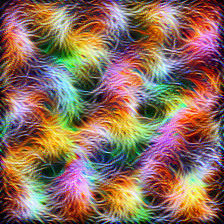
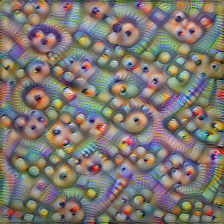

In [18]:
n = "mixed4b:111"

obj = create_objective(n, batch=0) - create_objective(n, batch=1)
param_f = lambda: get_image(w=224, batch=2)
images = visualize(
    obj, param_f=param_f, thresholds=thresholds_low, show_last_image=False
)

show_images(images[-1], labels=[n, f"-{n}"])

  0%|          | 0/513 [00:00<?, ?it/s]

mixed4b:154,-mixed4b:154

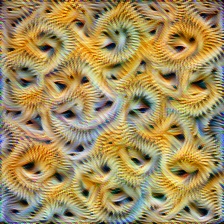
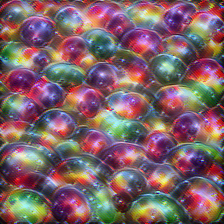

In [19]:
n = "mixed4b:154"

obj = create_objective(n, batch=0) - create_objective(n, batch=1)
param_f = lambda: get_image(w=224, batch=2)
images = visualize(
    obj, param_f=param_f, thresholds=thresholds_low, show_last_image=False
)

show_images(images[-1], labels=[n, f"-{n}"])

## Interaction between Neurons


In real life, combinations of neurons work together to represent images in neural networks. A helpful way to think about these combinations is geometrically: let's define activation space to be all possible combinations of neuron activations. We can then think of individual neuron activations as the **basis vectors** of this activation space. Conversely, a combination of neuron activations is then just a vector in this space.


  0%|          | 0/513 [00:00<?, ?it/s]

mixed4b:111,mixed4a:476,mixed4b:111 + mixed4a:476

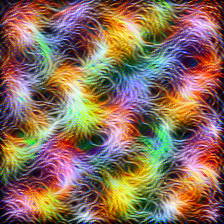
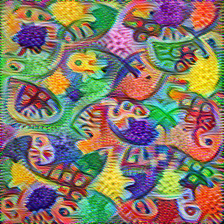
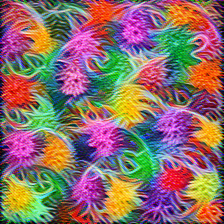

In [20]:
n1 = "mixed4b:111"
n2 = "mixed4a:476"

obj = (
    create_objective(n1, batch=0)
    + create_objective(n2, batch=1)
    + create_objective(n1, batch=2)
    + create_objective(n2, batch=2)
)
param_f = lambda: get_image(w=224, batch=3)
images = visualize(
    obj, param_f=param_f, thresholds=thresholds_low, show_last_image=False
)

show_images(images[-1], labels=[n1, n2, f"{n1} + {n2}"])

  0%|          | 0/513 [00:00<?, ?it/s]

mixed4a:479,mixed4b:360,mixed4a:479 + mixed4b:360

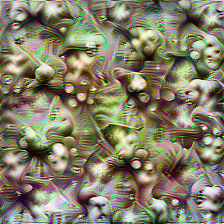
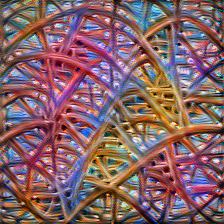
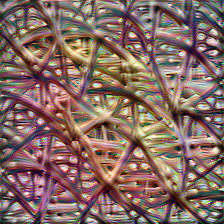

In [21]:
n1 = "mixed4a:479"
n2 = "mixed4b:360"

obj = (
    create_objective(n1, batch=0)
    + create_objective(n2, batch=1)
    + create_objective(n1, batch=2)
    + create_objective(n2, batch=2)
)
param_f = lambda: get_image(w=224, batch=3)
images = visualize(
    obj, param_f=param_f, thresholds=thresholds_low, show_last_image=False
)

show_images(images[-1], labels=[n1, n2, f"{n1} + {n2}"])

  0%|          | 0/1025 [00:00<?, ?it/s]

mixed4a:476,mixed4a:455,mixed4a:476 + mixed4a:455

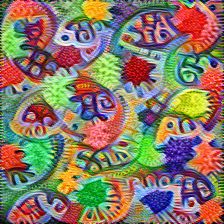
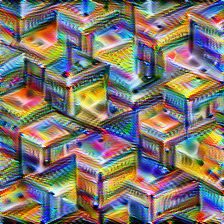
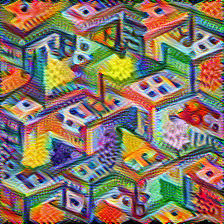

In [22]:
n1 = "mixed4a:476"
n2 = "mixed4a:455"

obj = (
    create_objective(n1, batch=0)
    + create_objective(n2, batch=1)
    + create_objective(n1, batch=2)
    + create_objective(n2, batch=2)
)
param_f = lambda: get_image(w=224, batch=3)
images = visualize(
    obj, param_f=param_f, thresholds=thresholds_low + [1024], show_last_image=False
)

show_images(images[-1], labels=[n1, n2, f"{n1} + {n2}"])

## Interpolation Between Channels


To see how the interacation between two neurons take place, we can interpolate between the two neurons between a number of images. The method below defines a function that takes the layer outputs and channel indices that needs to be interpolated and gives different loss to different batch of image. This results in the first image try to optimize the loss of the first layer-channel combination only and the last image that of the second layer-channel combination. Intermediate images optimize some part of both the loss.


In [23]:
def channel_interpolate(layer_outputs, channel_indices):
    if len(channel_indices) > 2:
        raise ValueError("Only two channel indices are allowed")

    if len(layer_outputs) == 1:
        layer_outputs = [layer_outputs[0], layer_outputs[0]]

    batch_n = len(layer_outputs[0])

    outs_1 = [
        -torch.mean(layer_outputs[0][n, channel_indices[0], ...])
        for n in range(batch_n)
    ]
    outs_2 = [
        -torch.mean(layer_outputs[1][n, channel_indices[1], ...])
        for n in range(batch_n)
    ]
    weights = np.arange(batch_n) / (batch_n - 1)
    loss = 0
    for n in range(batch_n):
        loss += (1 - weights[n]) * outs_1[n] + weights[n] * outs_2[n]
    return loss

This code cell interpolates between channels 476 and 455 of the `mixed4a` layer.


  0%|          | 0/513 [00:00<?, ?it/s]

0,1,2,3,4,5

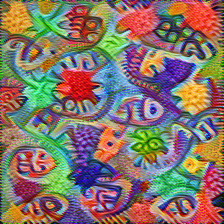
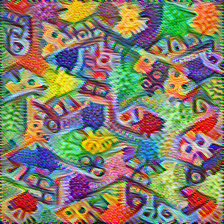
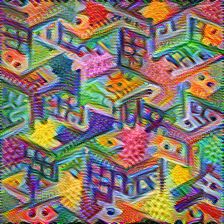
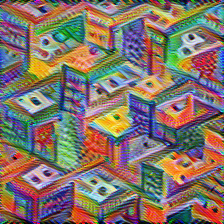
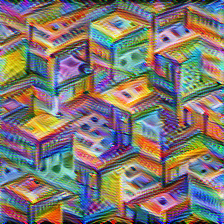
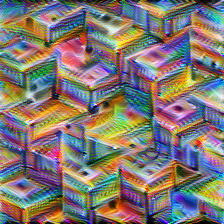

In [24]:
channel_indices = [476, 455]
layer_name = "mixed4a"
obj = create_objective_from_function(
    extractor_function=lambda x: channel_interpolate(x, channel_indices),
    layer_name=layer_name,
    use_multi_hook=True,
)

param_f = lambda: get_image(w=224, batch=6)
images = visualize(
    obj, param_f=param_f, thresholds=thresholds_low, show_last_image=True
)

One can easily interpolate between different layers and different channels.


  0%|          | 0/513 [00:00<?, ?it/s]

0,1,2,3,4,5

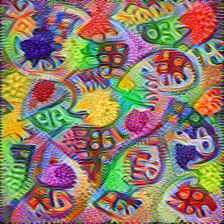
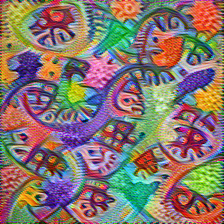
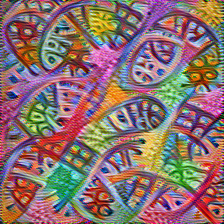
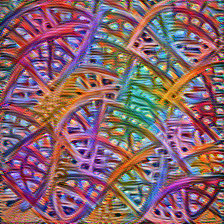
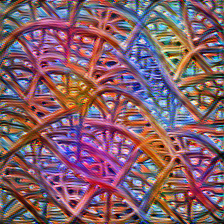
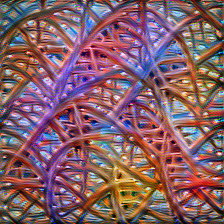

In [25]:
channel_indices = [476, 360]
layer_names = ["mixed4a", "mixed4b"]
obj = create_objective_with_multi_hook(
    extractor_function=lambda x: channel_interpolate(x, channel_indices),
    layer_names=layer_names,
)

param_f = lambda: get_image(w=224, batch=6)
images = visualize(
    obj, param_f=param_f, thresholds=thresholds_low, show_last_image=True
)

## Image Parameterization


Image parameterization allows us optimize the image in a different space as long as there is a mapping between the original image space and the parameterized image space. All the images that we have optimized above have used a parameterization where the image are being optimized in fourier space. This is a requirement for a nice visualization.


  0%|          | 0/513 [00:00<?, ?it/s]

  0%|          | 0/513 [00:00<?, ?it/s]

  0%|          | 0/513 [00:00<?, ?it/s]

  0%|          | 0/513 [00:00<?, ?it/s]

no_fft_no_dcor,no_fft_dcor,fft_no_dcor,fft_dcor

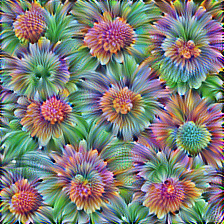
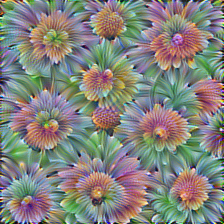
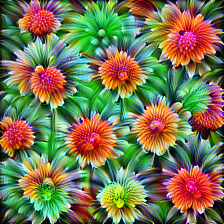
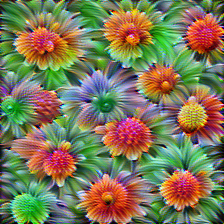

In [27]:
n = "mixed4b_pool_reduce_pre_relu_conv:16"
param_f = lambda: get_image(w=224, batch=1, fft=False, decorrelate=False)
images = visualize(
    create_objective(n),
    param_f=param_f,
    thresholds=thresholds_low,
    show_last_image=False,
)
no_fft_no_decorrelate_image = images[-1]

param_f = lambda: get_image(w=224, batch=1, fft=False, decorrelate=True)
images = visualize(
    create_objective(n),
    param_f=param_f,
    thresholds=thresholds_low,
    show_last_image=False,
)
no_fft_decorrelate_image = images[-1]

param_f = lambda: get_image(w=224, batch=1, fft=True, decorrelate=False)
images = visualize(
    create_objective(n),
    param_f=param_f,
    thresholds=thresholds_low,
    show_last_image=False,
)
fft_no_decorrelate_image = images[-1]

param_f = lambda: get_image(w=224, batch=1, fft=True, decorrelate=True)
images = visualize(
    create_objective(n),
    param_f=param_f,
    thresholds=thresholds_low,
    show_last_image=False,
)
fft_decorrelate_image = images[-1]

all_images = [
    no_fft_no_decorrelate_image,
    no_fft_decorrelate_image,
    fft_no_decorrelate_image,
    fft_decorrelate_image,
]

show_images(
    all_images, labels=["no_fft_no_dcor", "no_fft_dcor", "fft_no_dcor", "fft_dcor"]
)

Parameterization offers a lot of flaxibility. Here is an example that shows how one can use [CPPN](https://en.wikipedia.org/wiki/Compositional_pattern-producing_network) to optimize images.


  0%|          | 0/502 [00:00<?, ?it/s]


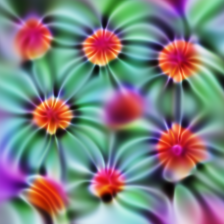

In [32]:
param_f = lambda: cppn(224)
images = visualize(
    create_objective("mixed4b_pool_reduce_pre_relu_conv:16"),
    param_f=param_f,
    thresholds=list(range(1, 526, 25)),
)

It is fun to see how the CPPN reaches to the final image:



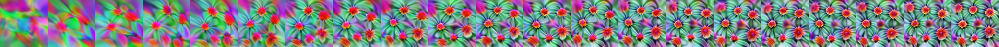

In [33]:
animate_sequence(images)